<a href="https://colab.research.google.com/github/Scjatto/PyCollab/blob/main/AudioClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Dependencies

* Tensorflow IO -> using IO devices for the sounds

In [1]:
!pip install tensorflow-io

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 59.7 MB/s eta 0:00:00


In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import tensorflow as tf
import tensorflow_io as tfio
print("Using Tensorflow Version: {}".format(tf.__version__))
print("Using Tensorflow IO Version: {}".format(tfio.__version__))

Using Tensorflow Version: 2.13.0
Using Tensorflow IO Version: 0.34.0


# Bird Call Identification from Audio Waveforms

* Model to determine whether a bird call is capuchin bird call or not
* Check density of capuchin bird call in a given audio clip

## Get the Data from Drive

In [3]:
current_wd = os.getcwd()

CAPUCHIN_DIR = os.path.join(current_wd, "drive", "MyDrive", "DataSets",
                            "AudioClassification", "ForestBirdClassification",
                            "Parsed_Capuchinbird_Clips")

NON_CAPUCHIN_DIR = os.path.join(current_wd, "drive", "MyDrive", "DataSets",
                            "AudioClassification", "ForestBirdClassification",
                            "Parsed_Not_Capuchinbird_Clips")


# Data Loading Function
 * Taken from official TF documents for audio input processing
 * Link: https://www.tensorflow.org/tutorials/audio/transfer_learning_audio

In [4]:
def load_wav_16k_mono(filename, verbose=False):
    # Load encoded wav file
    file_contents = tf.io.read_file(filename)
    if (verbose):
        print (file_contents)
    # Decode wav (tensors by channels) (Channel ==  1 for mono dimension (non stereo))
    wav, sample_rate = tf.audio.decode_wav(file_contents, desired_channels=1)
    if (verbose):
        print ("Raw Wave format: {}, Dim Wave format: {}, Raw Sample Rate: {}".format(wav, wav.shape, sample_rate))
    # Removes trailing axis
    wav = tf.squeeze(wav, axis=-1)
    sample_rate = tf.cast(sample_rate, dtype=tf.int64)
    if (verbose):
        print ("Squeezed Wave format: {}, Dim Wave format: {}, Cast Sample Rate: {}".format(wav, wav.shape, sample_rate))
    # Goes from 44100Hz to 16000hz - amplitude of the audio signal
    wav = tfio.audio.resample(wav, rate_in=sample_rate, rate_out=16000)
    if (verbose):
        print ("16KHz Wave format: {}, Dim Wave format: {},".format(wav, wav.shape))
    return wav

## Visualize a single data

In [5]:
cap_file = os.path.join(CAPUCHIN_DIR, "XC114131-2.wav")
non_cap_file = os.path.join(NON_CAPUCHIN_DIR, "Crickets-chirping-1.wav")

In [6]:
print ("Cap Wav: ")
cap_wav_16k_wav = load_wav_16k_mono(cap_file, True)

Cap Wav: 
tf.Tensor(b'RIFF$A\n\x00WAVEfmt \x10\x00\x00\x00\x01\x00\x02\x00\x80\xbb\x00\x00\x00\xee\x02\x00\x04\x00\x10\x00data\x00A\n\x00\xba\xff\xea\xff\xb2\xff\xb2\xff}\xff1\xff?\xff;\xff\x13\xff\xc8\xff1\xffA\x00\x8a\xffz\x00\xed\xffa\x00^\x00\xef\xff\x9d\x00o\xffd\x000\xff\x10\x00_\xff\xe3\xff\xfa\xff\xb8\xff\xa0\x00\xba\xff\xde\x00\xff\xff\xa8\x00+\x00G\x003\x00\xee\xffG\x00\xb2\xffR\x00\xcd\xffi\x002\x00\xb0\x00r\x00\xda\x00|\x00\xc0\x00\x8a\x00\x84\x00\x90\x00\x16\x00\x99\x00\xac\xff\xb9\x00\xcb\xff\xbc\x00U\x00\x9c\x00\xe2\x00\x84\x00m\x01h\x00\xa9\x01N\x00:\x01p\x00z\x00\xca\x00\xec\xff\xfb\x00\xb7\xff\xc3\x00\xe9\xffU\x00W\x00\xf3\xff\xb9\x00\xbc\xff\xf9\x00\xe1\xff\x01\x01=\x00\xc4\x00s\x00w\x00\x82\x009\x00K\x00\xf3\xff\xb5\xff\xd1\xffU\xff\x02\x00u\xff8\x00\xd0\xff*\x00V\x00\x00\x00\xab\x00\xf6\xffQ\x00\x12\x00\xa6\xff!\x00@\xff\xdf\xff9\xffw\xff\x91\xff@\xff\x1e\x00=\xffu\x00e\xffI\x00\xa6\xff\xba\xff\xb8\xff)\xff\xae\xff\xe9\xfe\xb6\xff=\xff\x8f\xff\xfe\xff7\xfft\x00\x05

In [7]:
print ("Non Cap Wav: ")
non_cap_wav_16k_wav = load_wav_16k_mono(non_cap_file, True)

Non Cap Wav: 
tf.Tensor(b'RIFF\x0c\xc3\x08\x00WAVEfmt \x10\x00\x00\x00\x01\x00\x02\x00D\xac\x00\x00\x10\xb1\x02\x00\x04\x00\x10\x00data\xe8\xc2\x08\x00\xd6\xff\xaf\xff\xfd\xff$\xff\x1f\x00\xf9\xfe\x02\x00)\xff\xe5\xffk\xff6\x00\x8b\xffL\x00\xe7\xff+\x00\x86\x00=\x00;\x01/\x00\x19\x01C\x00v\x00\x0c\x00\x15\x00\xa7\xff\x06\x00\xda\xff\xf4\xff\x17\x008\xff\xff\xff\xe7\xfe\xd5\xffa\xff\x9d\xff:\x00\x92\xff\xc5\x00{\x00\xdc\x00\xdc\x00\xef\x00\x02\x00\xdb\x00\x00\x00\xd4\x00l\x00\x15\x00\x9b\x00p\xffj\x00\\\xff\xad\xff\x14\xffs\xff1\xff\xda\xffu\xff>\x00\x0c\x00\xf8\xff\x87\x00\xce\xff\xe4\x00G\x00N\x01\xb3\x00\xf0\x00\xc2\x00g\x00\x0b\x00\xe7\xff\xb8\xff\xcf\xff\x02\x00\xa9\xff\xd6\xff\r\xffR\xffb\xff\xc5\xfe\xf1\xff\x1c\xff-\x00\xec\xff{\x00\x14\x00\x9b\x00\xc2\xff\x16\x01\x9f\xff\xf8\x00.\x00\xfa\xff\xbf\x00O\xffh\x00\xca\xfe\x9b\xff\xa9\xfej\xff\xa1\xfe\x8c\xff\x85\xfeC\xff\xb2\xfe3\xffn\xff\xa7\xff\x98\x002\x00\x86\x00\x93\x00\xc3\xff|\x00f\xff}\x00d\xff\xec\x00|\xff\xad\x00\xf0\xfe\xa

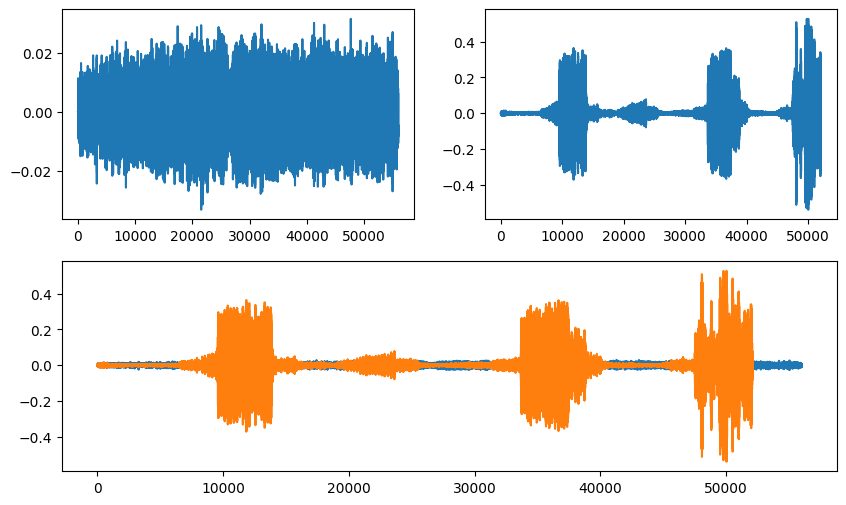

In [8]:
plt.figure(figsize=(10,6))
plt.subplot(2,2,1)
plt.plot(cap_wav_16k_wav)
plt.subplot(2,2,2)
plt.plot(non_cap_wav_16k_wav)
plt.subplot(2,1,2)
plt.plot(cap_wav_16k_wav)
plt.plot(non_cap_wav_16k_wav)
plt.show()

# Create Tensorflow DataSets

* Creating Dataset on the 16KHz processed waveform
* Use tf apis to create proper dataset
* Add Labels to capuchin bird call and non capuchin bird call

## Create 16KHz waveform for all the .wav files for capuchin and non capuchin bird calls

In [9]:
CAPU_CALL = tf.data.Dataset.list_files(os.path.join(CAPUCHIN_DIR, "*.wav"))
NON_CAPU_CALL = tf.data.Dataset.list_files(os.path.join(NON_CAPUCHIN_DIR, "*.wav"))

In [10]:
# Numpy iterator example: similar to c++ iterator, shuffle (<buffer_size>) shuffles the array
# by tha batch of buffer size mentioned
print(CAPU_CALL.shuffle(100).as_numpy_iterator().next())
print (type (CAPU_CALL))

b'/content/drive/MyDrive/DataSets/AudioClassification/ForestBirdClassification/Parsed_Capuchinbird_Clips/XC216010-7.wav'
<class 'tensorflow.python.data.ops.shuffle_op._ShuffleDataset'>


## Add Binary labels to the waveforms
* Attach 1 with capuchin call files
* Attach 0 with non capuchin call files
* Concatenate both data into one variable, forming the final dataset

In [11]:
capu_call_data = tf.data.Dataset.zip((CAPU_CALL, tf.data.Dataset.from_tensor_slices(tf.ones(len(CAPU_CALL)))))
non_capu_call_data = tf.data.Dataset.zip((NON_CAPU_CALL, tf.data.Dataset.from_tensor_slices(tf.zeros(len(NON_CAPU_CALL)))))
data_set = capu_call_data.concatenate(non_capu_call_data)

In [12]:
data_set.shuffle(10000).as_numpy_iterator().next()

(b'/content/drive/MyDrive/DataSets/AudioClassification/ForestBirdClassification/Parsed_Not_Capuchinbird_Clips/crickets-chirping-crickets-sound-18.wav',
 0.0)

## Visualizing Capuchin calls in depth

* Calculating various statistical parameters on the capuchin call recordings
* Accumulate the wave lengths of the capuchin calls in a variable

In [13]:
capu_lengths = []
for file in os.listdir(CAPUCHIN_DIR):
    tensor_wave = load_wav_16k_mono(os.path.join(CAPUCHIN_DIR, file))
    capu_lengths.append(len(tensor_wave))

In [14]:
non_capu_lengths = []
for file in os.listdir(NON_CAPUCHIN_DIR):
    tensor_wave = load_wav_16k_mono(os.path.join(NON_CAPUCHIN_DIR, file))
    non_capu_lengths.append(len(tensor_wave))

## Mean, Min and Max lengths of Capuchin calls

In [15]:
tf.print ("Mean Capuchin Length: {}, Mean time of calls: {}".format(tf.math.reduce_mean(capu_lengths), tf.math.reduce_mean(capu_lengths) / 16000))
tf.print ("Min Capuchin Length: {}, Min time of calls: {}".format(tf.math.reduce_min(capu_lengths), tf.math.reduce_min(capu_lengths) / 16000))
tf.print ("Max Capuchin Length: {}, Max time of calls: {}".format(tf.math.reduce_max(capu_lengths), tf.math.reduce_max(capu_lengths) / 16000))

Mean Capuchin Length: 54156, Mean time of calls: 3.38475
Min Capuchin Length: 32000, Min time of calls: 2.0
Max Capuchin Length: 80000, Max time of calls: 5.0


## Mean, Min and Max lengths of Non Capuchin calls

In [16]:
tf.print ("Mean Non Capuchin Length: {}, Mean time of calls: {}".format(tf.math.reduce_mean(non_capu_lengths), tf.math.reduce_mean(non_capu_lengths) / 16000))
tf.print ("Min Non Capuchin Length: {}, Min time of calls: {}".format(tf.math.reduce_min(non_capu_lengths), tf.math.reduce_min(non_capu_lengths) / 16000))
tf.print ("Max Non Capuchin Length: {}, Max time of calls: {}".format(tf.math.reduce_max(non_capu_lengths), tf.math.reduce_max(non_capu_lengths) / 16000))

Mean Non Capuchin Length: 49327, Mean time of calls: 3.0829375
Min Non Capuchin Length: 47229, Min time of calls: 2.9518125
Max Non Capuchin Length: 63087, Max time of calls: 3.9429375


# Creation of Audio Spectrogram and its Vizualization

* The Idea of converting a waveform into image matrix
* This matrix is what we call as spectrogram
* This model will also allow us to do use the same model for similar classifications for images as well

## Build a preprocess function

* If the waveform has less frequency than the mean frequency, then pad it with 0
* tf.zeros for leftover values gets concatenated to the waveform
* Default value set to 50000, since above means have near to 50000 frequency

In [17]:
def preprocess_to_spectogram(file_path, label, mean_freq=50000):
    wav = load_wav_16k_mono(file_path)
    wav = wav[:mean_freq] # Accept waveform till mean frequency
    zero_padding = tf.zeros([mean_freq] - tf.shape(wav), dtype=tf.float32) # Pad 0 for every waveform which is less than mean freq
    wav = tf.concat([zero_padding, wav],0)
    spectrogram = tf.signal.stft(wav, frame_length=320, frame_step=32)
    spectrogram = tf.abs(spectrogram)
    spectrogram = tf.expand_dims(spectrogram, axis=2) # CNN needs extra dimension, hence expand dimention
    return spectrogram, label

## Vizualize The Spectrogram

### Vizulaize the Capuchin spectrogram

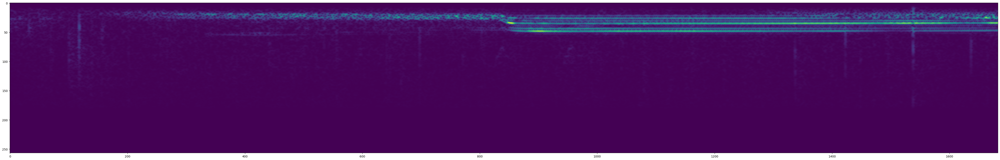

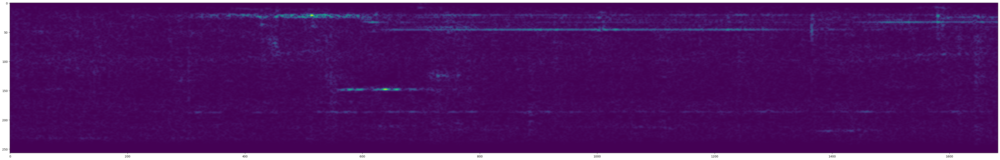

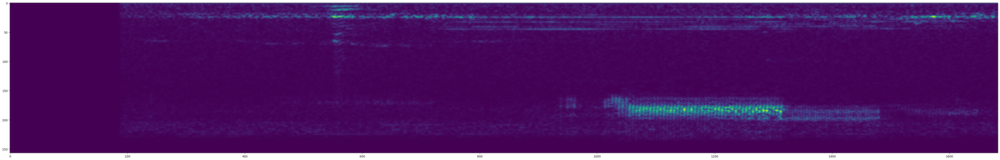

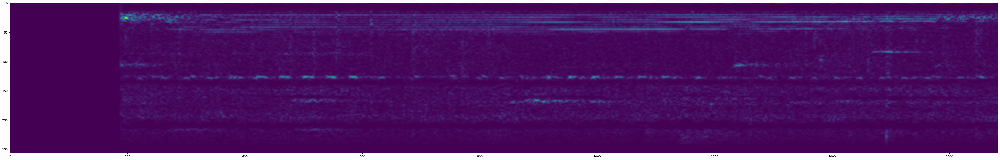

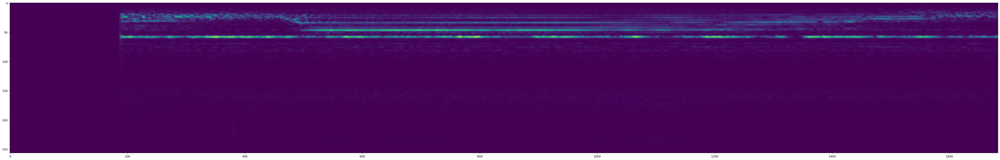

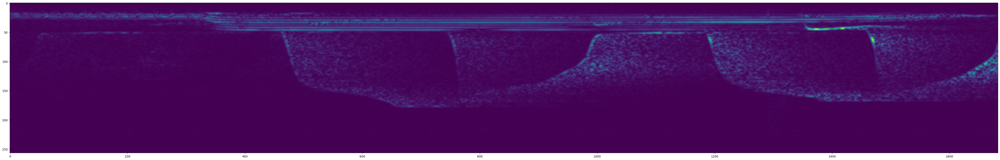

In [18]:
# Check 6 random capuchin calls
for i in range (6):
    filepath, label = capu_call_data.shuffle(buffer_size=10000).as_numpy_iterator().next()
    spectrogram, label = preprocess_to_spectogram(filepath, label, tf.math.reduce_mean(capu_lengths))
    plt.figure(figsize=(60,30))
    plt.imshow(tf.transpose(spectrogram)[0])
    plt.show()

### Vizulaize the Non Capuchin spectrogram

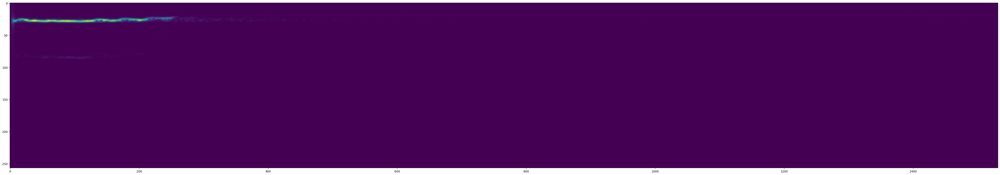

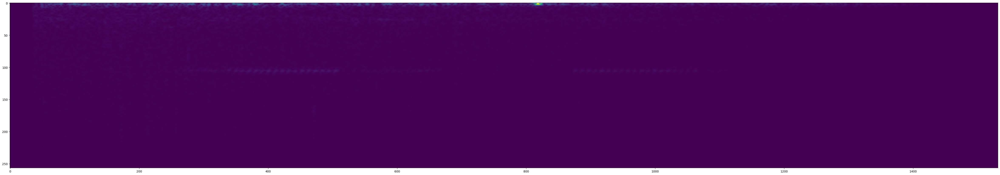

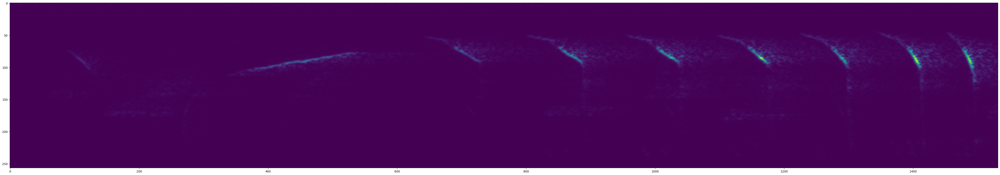

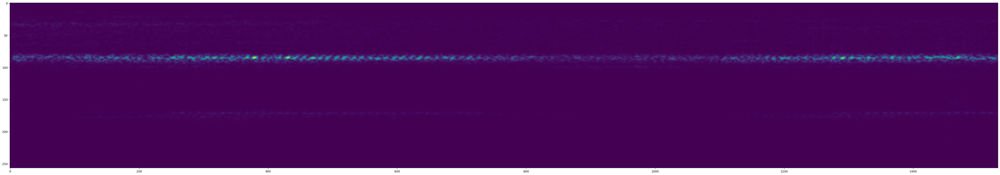

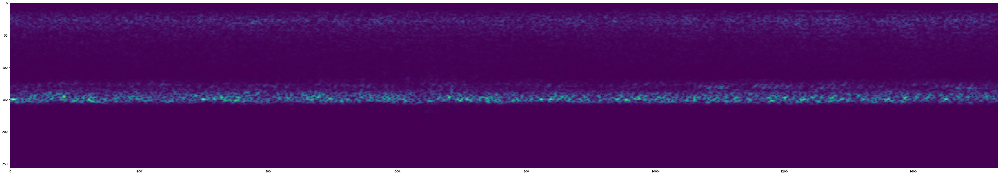

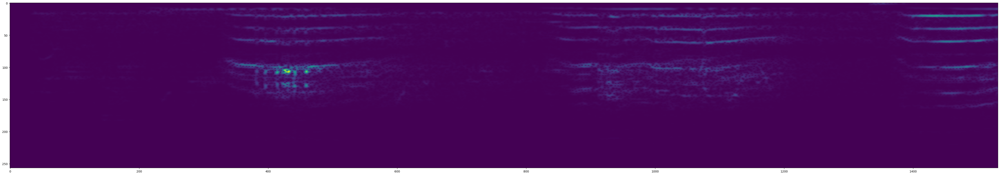

In [19]:
# Check 6 random capuchin calls
for i in range (6):
    filepath, label = non_capu_call_data.shuffle(buffer_size=10000).as_numpy_iterator().next()
    spectrogram, label = preprocess_to_spectogram(filepath, label, tf.math.reduce_mean(non_capu_lengths))
    plt.figure(figsize=(60,30))
    plt.imshow(tf.transpose(spectrogram)[0])
    plt.show()

In [20]:
print ("Length of capuchin dataset: {}, Length of Non Capuchin Dataset: {}".format(len(capu_call_data), len(non_capu_call_data)))
print ("Length of Total dataset: {}".format(len(data_set)))

Length of capuchin dataset: 217, Length of Non Capuchin Dataset: 605
Length of Total dataset: 822


# Building the Deep Learning Model


## Create Tensrflow data Pipeline
* Map data to the preprocess function - change shape of data to shape of axis 3, for CNN layer input
* Cache the data preprocessed
* Shuffle data so that the psitive and negative datas are shuffled - removed unecessary bias
* Batch the data for certain numbers to test at the same time
* Prefetch data for proper CPU/GPU Utilization



MAP -> CACHE -> SHUFFLE -> BATCH -> PREFETCH

MCSBP

In [21]:
CONV_BATCH_SIZE = 10


data = data_set.map(preprocess_to_spectogram)
data = data.cache()
data = data.shuffle(buffer_size=1000)
data = data.batch(CONV_BATCH_SIZE)
data = data.prefetch(CONV_BATCH_SIZE//2)

In [22]:
# print(data.shuffle(1000).as_numpy_iterator().next())
print ("Length of dataset: {}, and number of batches for the CNN: {}".format(len(data_set), len(data)))

Length of dataset: 822, and number of batches for the CNN: 83


## Split into Training and Testing Partitions

* 70% of the length to be taken as train data
* rest 30% as test data

In [23]:
train_data_len = math.ceil(len(data) * 0.7)
test_data_len = len(data) - train_data_len

print ("Length of training data: {} and testing data: {}".format(train_data_len, test_data_len))

Length of training data: 59 and testing data: 24


In [24]:
train_data = data.take(train_data_len)
test_data = data.skip(train_data_len).take(test_data_len)

## Check one of the train and test data

In [25]:
samples, labels = train_data.as_numpy_iterator().next()
# print ("Example of train data: {}".format(samples, labels))
print ("Shape of train sample: {}".format(samples.shape))

conv_input_shape = samples.shape[1:]
print ("Convolution Data Shape: {}, of tyoe: {}".format(conv_input_shape, type(conv_input_shape)))

samples, labels = test_data.as_numpy_iterator().next()
# print ("Example of test data: {}, {}".format(samples, labels))
print ("Shape of test sample: {}".format(samples.shape))

Shape of train sample: (10, 1553, 257, 1)
Convolution Data Shape: (1553, 257, 1), of tyoe: <class 'tuple'>
Shape of test sample: (10, 1553, 257, 1)


## Building Layers for the neural network (CNN)

In [26]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten

In [27]:
model = Sequential()
model.add(Conv2D(CONV_BATCH_SIZE, (3,3), activation='relu', input_shape=conv_input_shape))
model.add(Conv2D(CONV_BATCH_SIZE, (3,3), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [28]:
model.compile('Adam', loss='BinaryCrossentropy', metrics=[tf.keras.metrics.Recall(),tf.keras.metrics.Precision(),tf.keras.metrics.Accuracy()])

In [29]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 1551, 255, 10)     100       
                                                                 
 conv2d_1 (Conv2D)           (None, 1549, 253, 10)     910       
                                                                 
 flatten (Flatten)           (None, 3918970)           0         
                                                                 
 dense (Dense)               (None, 128)               501628288 
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 501629427 (1.87 GB)
Trainable params: 501629427 (1.87 GB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [30]:
hist = model.fit(train_data, epochs=4, validation_data=test_data)

Epoch 1/4
59/59 [==============================] - 21s 175ms/step - loss: 3.4868 - recall: 0.9133 - precision: 0.8155 - accuracy: 0.5136 - val_loss: 0.0711 - val_recall: 0.9836 - val_precision: 0.9677 - val_accuracy: 0.3534
Epoch 2/4
59/59 [==============================] - 10s 163ms/step - loss: 0.1976 - recall: 0.9739 - precision: 0.9739 - accuracy: 0.3085 - val_loss: 0.0273 - val_recall: 0.9828 - val_precision: 1.0000 - val_accuracy: 0.2371
Epoch 3/4
59/59 [==============================] - 10s 164ms/step - loss: 0.0267 - recall: 0.9860 - precision: 0.9930 - accuracy: 0.2593 - val_loss: 0.0042 - val_recall: 1.0000 - val_precision: 1.0000 - val_accuracy: 0.2328
Epoch 4/4
59/59 [==============================] - 10s 164ms/step - loss: 0.0112 - recall: 0.9937 - precision: 1.0000 - accuracy: 0.2932 - val_loss: 0.0109 - val_recall: 1.0000 - val_precision: 1.0000 - val_accuracy: 0.2845


## Plots for various metrics during training

* Recall and Loss visualization

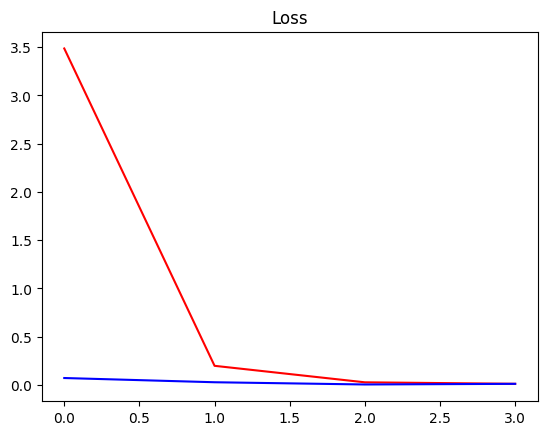

In [31]:
plt.title('Loss')
plt.plot(hist.history['loss'], 'r')
plt.plot(hist.history['val_loss'], 'b')
plt.show()

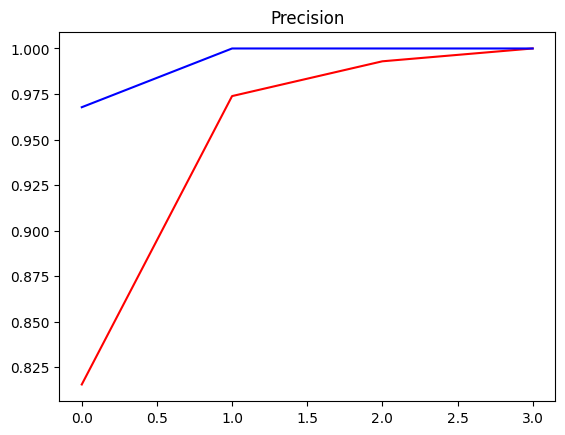

In [33]:
plt.title('Precision')
plt.plot(hist.history['precision'], 'r')
plt.plot(hist.history['val_precision'], 'b')
plt.show()

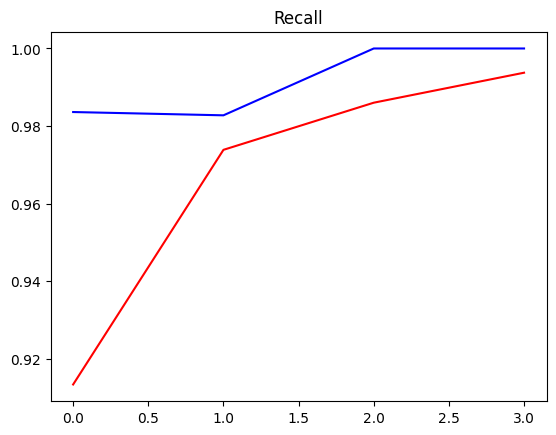

In [34]:
plt.title('Recall')
plt.plot(hist.history['recall'], 'r')
plt.plot(hist.history['val_recall'], 'b')
plt.show()

## Make prediction on one clip

* Prediction on one of thw batches
* Binary labling on prediction, > 0.5 == 1 else 0

In [35]:
X_test, y_test = test_data.as_numpy_iterator().next()
print (X_test.shape, len(test_data))

(10, 1553, 257, 1) 24


In [36]:
yhat = model.predict(X_test)
print("Predicted y: {}".format(yhat))

1/1 [==============================] - 0s 99ms/step
Predicted y: [[1.0000000e+00]
 [1.0000000e+00]
 [7.2460796e-05]
 [2.0078550e-08]
 [1.0000000e+00]
 [1.0909090e-34]
 [1.2717786e-17]
 [1.0000000e+00]
 [2.0319983e-13]
 [9.0286342e-23]]


In [37]:
yhat = [1 if prediction > 0.5 else 0 for prediction in yhat]

In [39]:
print (yhat, y_test, len (yhat), len (y_test))
print ("Predicted capuchins: {}, actual capuchins: {}".format(tf.reduce_sum(yhat), tf.reduce_sum(y_test)))

[1, 1, 0, 0, 1, 0, 0, 1, 0, 0] [1. 1. 0. 0. 1. 0. 0. 1. 0. 0.] 10 10
Predicted capuchins: 4, actual capuchins: 4.0


# Test the model on greater Forest Dataset

* Now the model is complete, and the predictions look good, the model can now be used to predict the capuchin calls over extnded clips of forest audio clips


In [40]:
def load_mp3_16k_mono(filename):
    """ Load a WAV file, convert it to a float tensor, resample to 16 kHz single-channel audio. """
    res = tfio.audio.AudioIOTensor(filename)
    # Convert to tensor and combine channels
    tensor = res.to_tensor()
    tensor = tf.math.reduce_sum(tensor, axis=1) / 2
    # Extract sample rate and cast
    sample_rate = res.rate
    sample_rate = tf.cast(sample_rate, dtype=tf.int64)
    # Resample to 16 kHz
    wav = tfio.audio.resample(tensor, rate_in=sample_rate, rate_out=16000)
    return wav

In [41]:
FOREST_DATA = os.path.join(current_wd, "drive", "MyDrive", "DataSets",
                            "AudioClassification", "ForestBirdClassification",
                            "Forest Recordings")

## Check on one forest data

In [42]:
forest_data_one = os.path.join(FOREST_DATA, "recording_00.mp3")

In [59]:
wav_forest = load_mp3_16k_mono(forest_data_one)

* Audio Slice wrt to the average timeslice (frequency) set during creating the wav preprocess == 50000

In [60]:
audio_slices = tf.keras.utils.timeseries_dataset_from_array(wav_forest, wav_forest, sequence_length=50000, sequence_stride=50000, batch_size=1)

In [49]:
samples, index = audio_slices.as_numpy_iterator().next()
print (samples.shape , len(audio_slices))

(1, 50000) 57


## Convert Forest audio slices into spectrograms

In [50]:
def preprocess_mp3(sample, index, mean_freq=50000):
    sample = sample[0]
    zero_padding = tf.zeros([mean_freq] - tf.shape(sample), dtype=tf.float32)
    wav = tf.concat([zero_padding, sample],0)
    spectrogram = tf.signal.stft(wav, frame_length=320, frame_step=32)
    spectrogram = tf.abs(spectrogram)
    spectrogram = tf.expand_dims(spectrogram, axis=2)
    return spectrogram

In [61]:
# audio_slices = tf.keras.utils.timeseries_dataset_from_array(wav_forest, wav_forest, sequence_length=16000, sequence_stride=16000, batch_size=1)
audio_slices = audio_slices.map(preprocess_mp3)
audio_slices = audio_slices.batch(64)

In [71]:
yhat = model.predict(audio_slices)
yhat = [1 if prediction > 0.9 else 0 for prediction in yhat] # Absolute confidence of the forest slices

print (yhat)
print (len(yhat))

1/1 [==============================] - 2s 2s/step
[0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
57


## Group Consecutive Detections

In [72]:
from itertools import groupby
yhat = [key for key, group in groupby(yhat)]
calls = tf.math.reduce_sum(yhat).numpy()

In [73]:
calls

5

## Loop through all recordings

In [77]:
results = {}

for forest_files in os.listdir(FOREST_DATA):
    file_name = os.path.join(FOREST_DATA, forest_files)

    wav_forest = load_mp3_16k_mono(file_name)
    audio_slices = tf.keras.utils.timeseries_dataset_from_array(wav_forest, wav_forest, sequence_length=50000, sequence_stride=50000, batch_size=1)
    audio_slices = audio_slices.map(preprocess_mp3)
    audio_slices = audio_slices.batch(64)

    yhat = model.predict(audio_slices)

    results[file_name] = yhat




1/1 [==============================] - 1s 1s/step


In [78]:
len (results)

100

## Class Predictions

In [80]:
class_pred = {}

for file_name, conf_matrix_1d in results.items():
    class_pred[file_name] = [1 if prediction > 0.9 else 0 for prediction in conf_matrix_1d] # Absolute confidence of the forest slices

print (len (class_pred))

100


In [82]:
postprocessed = {}
for file_name, scores in class_pred.items():
    postprocessed[file_name] = tf.math.reduce_sum([key for key, group in groupby(scores)]).numpy()
print(len(postprocessed))

100


In [88]:
import csv

RESULTS_CSV_FILE = os.path.join(current_wd, "Results", "ForestCapuchinDetection", "ForestCapuchinDetection.csv")
with open(RESULTS_CSV_FILE, 'w', newline='') as f:
    writer = csv.writer(f, delimiter=',')
    writer.writerow(['recording', 'capuchin_calls'])
    for key, value in postprocessed.items():
        writer.writerow([key, value])